In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from google.colab import files
uploaded=files.upload()
for i in uploaded.keys():
  print('user uploaded"{name}" with length {length} bytes'.format(name=i,length=len(uploaded[i])))

Saving data_clean_airbnb.xlsx to data_clean_airbnb.xlsx
user uploaded"data_clean_airbnb.xlsx" with length 16822542 bytes


In [2]:
file="data_clean_airbnb.xlsx"
data=pd.read_excel(file)

In [3]:
data.head()

             id                                              NAME  \
0       1001254                Clean & quiet apt home by the park   
1       1002102                             Skylit Midtown Castle   
2       1002403               THE VILLAGE OF HARLEM....NEW YORK !   
3       1002755                                               NaN   
4       1003689  Entire Apt: Spacious Studio/Loft by central park   
...         ...                                               ...   
102594  6092437                        Spare room in Williamsburg   
102595  6092990                     Best Location near Columbia U   
102596  6093542                    Comfy, bright room in Brooklyn   
102597  6094094                  Big Studio-One Stop from Midtown   
102598  6094647                              585 sf Luxury Studio   

            host id host_identity_verified    host name neighbourhood group  \
0       80014485718            unconfirmed     Madaline            Brooklyn   
1       52335

In [4]:
data.columns

Index(['id', 'NAME', 'host id', 'host_identity_verified', 'host name',
       'neighbourhood group', 'neighbourhood', 'lat', 'long', 'country',
       'country code', 'instant_bookable', 'cancellation_policy', 'room type',
       'Construction year', 'price', 'service fee', 'minimum nights',
       'number of reviews', 'last review', 'reviews per month',
       'review rate number', 'calculated host listings count',
       'availability 365', 'house_rules', 'license'],
      dtype='object')

**** my dataset into numerical  and categorical subfields and assigning them to different variables ****

In [5]:
d1=data.select_dtypes(include=np.number).columns
print(d1)
print(data.loc[:,'country code':'service fee'])

Index(['id', 'host id', 'lat', 'long', 'instant_bookable', 'Construction year',
       'minimum nights', 'number of reviews', 'reviews per month',
       'review rate number', 'calculated host listings count',
       'availability 365'],
      dtype='object')
       country code  instant_bookable cancellation_policy        room type  \
0                US               0.0              strict     Private room   
1                US               0.0            moderate  Entire home/apt   
2                US               1.0            flexible     Private room   
3                US               1.0            moderate  Entire home/apt   
4                US               0.0            moderate  Entire home/apt   
...             ...               ...                 ...              ...   
102594           US               0.0            flexible     Private room   
102595           US               1.0            moderate     Private room   
102596           US               1.0 

In [6]:
d2=data.select_dtypes(include='object').columns
print(d2)

Index(['NAME', 'host_identity_verified', 'host name', 'neighbourhood group',
       'neighbourhood', 'country', 'country code', 'cancellation_policy',
       'room type', 'price', 'service fee', 'last review', 'house_rules',
       'license'],
      dtype='object')


*** Checking length of my newly formed lists and data type to affirm the authenticity for data analysis***

In [7]:
len(data.columns)

26

In [8]:
len(d1)

12

In [9]:
len(d2)

14

In [10]:
d1.dtype

dtype('O')

In [11]:
data.columns.dtype

dtype('O')

In [12]:
d2.dtype

dtype('O')

# checking the null values of my dataset

In [13]:
data.isna().sum()

id                                     0
NAME                                 270
host id                                0
host_identity_verified               289
host name                            408
neighbourhood group                   29
neighbourhood                         16
lat                                    8
long                                   8
country                              532
country code                         131
instant_bookable                     105
cancellation_policy                   76
room type                              0
Construction year                    214
price                                247
service fee                          273
minimum nights                       409
number of reviews                    183
last review                        15893
reviews per month                  15879
review rate number                   326
calculated host listings count       319
availability 365                     448
house_rules     

***23 data fields(columns) have null values in them***

** To get the unique values present in each column to get better idea of dataset **

In [14]:
for i in data.columns:
  print(data[i].value_counts())

id
6044940     2
6067584     2
6077525     2
6076973     2
6076421     2
           ..
19804390    1
19803837    1
19803285    1
19802733    1
57367417    1
Name: count, Length: 102058, dtype: int64
NAME
Home away from home                                   33
Water View King Bed Hotel Room                        30
Hillside Hotel                                        30
New york Multi-unit building                          27
Brooklyn Apartment                                    27
                                                      ..
â™‚ â™€ Sunny Bedroom in Popular Brooklyn              1
â™‚ â™€ Large Room Close to Express Subway + Bus       1
Clean room in Soho/Nolita                              1
â™‚ â™€ Large Sunny Bedroom Walk to Express Subway     1
Parisian Style Apartment in Heart of Brooklyn          1
Name: count, Length: 61280, dtype: int64
host id
38729751923    2
3895711649     2
43698780331    2
83121548580    2
95831271296    2
              ..
18961598806    1
3

# Replacing null values of categorical fields with the mode values of respective fields

In [15]:
data['NAME'].fillna(data['NAME'].mode()[0],inplace=True)
data['host_identity_verified'].fillna(data['host_identity_verified'].mode()[0],inplace=True)
data['host name'].fillna(data['host name'].mode()[0],inplace=True)
data['neighbourhood group'].fillna(data['neighbourhood group'].mode()[0],inplace=True)
data['neighbourhood'].fillna(data['neighbourhood'].mode()[0],inplace=True)
data['country'].fillna(data['country'].mode()[0],inplace=True)
data['country code'].fillna(data['country code'].mode()[0],inplace=True)
data['cancellation_policy'].fillna(data['cancellation_policy'].mode()[0],inplace=True)
data['instant_bookable'].fillna(data['instant_bookable'].mode()[0],inplace=True)
data['Construction year'].fillna(data['Construction year'].mode()[0],inplace=True)
data['house_rules'].fillna(data['house_rules'].mode()[0],inplace=True)
data['license'].fillna(data['license'].mode()[0],inplace=True)
data['last review'].fillna(data['last review'].mode()[0],inplace=True)

 ***I am going to check null values after dealing with them everytime to check effectiveness of method***

In [16]:
data.isna().sum()

id                                    0
NAME                                  0
host id                               0
host_identity_verified                0
host name                             0
neighbourhood group                   0
neighbourhood                         0
lat                                   8
long                                  8
country                               0
country code                          0
instant_bookable                      0
cancellation_policy                   0
room type                             0
Construction year                     0
price                               247
service fee                         273
minimum nights                      409
number of reviews                   183
last review                           0
reviews per month                 15879
review rate number                  326
calculated host listings count      319
availability 365                    448
house_rules                           0


In [17]:
data.head()

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,41662/AL
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,41662/AL
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,unconfirmed,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$124,3.0,0.0,6/23/2019,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",41662/AL
3,1002755,Home away from home,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,$74,30.0,270.0,2019-05-07 00:00:00,4.64,4.0,1.0,322.0,House Rules 1. Check-in is 4 pm local time. If...,41662/AL
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,$41,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",41662/AL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102594,6092437,Spare room in Williamsburg,12312296767,verified,Krik,Brooklyn,Williamsburg,40.70862,-73.94651,United States,...,$169,1.0,0.0,6/23/2019,NaN,3.0,1.0,227.0,No Smoking No Parties or Events of any kind Pl...,41662/AL
102595,6092990,Best Location near Columbia U,77864383453,unconfirmed,Mifan,Manhattan,Morningside Heights,40.80460,-73.96545,United States,...,$167,1.0,1.0,2015-06-07 00:00:00,0.02,2.0,2.0,395.0,House rules: Guests agree to the following ter...,41662/AL
102596,6093542,"Comfy, bright room in Brooklyn",69050334417,unconfirmed,Megan,Brooklyn,Park Slope,40.67505,-73.98045,United States,...,$198,3.0,0.0,6/23/2019,NaN,5.0,1.0,342.0,House Rules 1. Check-in is 4 pm local time. If...,41662/AL
102597,6094094,Big Studio-One Stop from Midtown,11160591270,unconfirmed,Christopher,Queens,Long Island City,40.74989,-73.93777,United States,...,$109,2.0,5.0,2015-11-10 00:00:00,0.10,3.0,1.0,386.0,House Rules 1. Check-in is 4 pm local time. If...,41662/AL


# Replacing null values of numerical fields with the mean values of respective fields

In [18]:
data['lat'].fillna(data['lat'].mean(),inplace=True)
data['long'].fillna(data['long'].mean(),inplace=True)
data['minimum nights'].fillna(data['minimum nights'].mean(),inplace=True)
data['number of reviews'].fillna(data['number of reviews'].mean(),inplace=True)
data['reviews per month'].fillna(data['reviews per month'].mean(),inplace=True)
data['review rate number'].fillna(data['review rate number'].mean(),inplace=True)
data['calculated host listings count'].fillna(data['calculated host listings count'].mean(),inplace=True)
data['availability 365'].fillna(data['availability 365'].mean(),inplace=True)

In [19]:
data.head()

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,$193,10.0,9.0,10/19/2021,0.210000,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,41662/AL
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,$28,30.0,45.0,5/21/2022,0.380000,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,41662/AL
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,unconfirmed,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$124,3.0,0.0,6/23/2019,1.374022,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",41662/AL
3,1002755,Home away from home,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,$74,30.0,270.0,2019-05-07 00:00:00,4.640000,4.0,1.0,322.0,House Rules 1. Check-in is 4 pm local time. If...,41662/AL
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,$41,10.0,9.0,11/19/2018,0.100000,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",41662/AL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102594,6092437,Spare room in Williamsburg,12312296767,verified,Krik,Brooklyn,Williamsburg,40.70862,-73.94651,United States,...,$169,1.0,0.0,6/23/2019,1.374022,3.0,1.0,227.0,No Smoking No Parties or Events of any kind Pl...,41662/AL
102595,6092990,Best Location near Columbia U,77864383453,unconfirmed,Mifan,Manhattan,Morningside Heights,40.80460,-73.96545,United States,...,$167,1.0,1.0,2015-06-07 00:00:00,0.020000,2.0,2.0,395.0,House rules: Guests agree to the following ter...,41662/AL
102596,6093542,"Comfy, bright room in Brooklyn",69050334417,unconfirmed,Megan,Brooklyn,Park Slope,40.67505,-73.98045,United States,...,$198,3.0,0.0,6/23/2019,1.374022,5.0,1.0,342.0,House Rules 1. Check-in is 4 pm local time. If...,41662/AL
102597,6094094,Big Studio-One Stop from Midtown,11160591270,unconfirmed,Christopher,Queens,Long Island City,40.74989,-73.93777,United States,...,$109,2.0,5.0,2015-11-10 00:00:00,0.100000,3.0,1.0,386.0,House Rules 1. Check-in is 4 pm local time. If...,41662/AL


** First I have to remove $ sign and then after converting 'service fee' and 'price' columns into numeric columns from object type I will replace the NaN values with means of their respective columns**

In [20]:
data['price']=data['price'].str.replace('$','')
data['service fee']=data['service fee'].str.replace('$','')

In [21]:
print(data['price'],data['service fee'])

0           966 
1           142 
2           620 
3           368 
4           204 
           ...  
102594      844 
102595      837 
102596      988 
102597      546 
102598    1,032 
Name: price, Length: 102599, dtype: object 0         193 
1          28 
2         124 
3          74 
4          41 
          ... 
102594    169 
102595    167 
102596    198 
102597    109 
102598    206 
Name: service fee, Length: 102599, dtype: object


Converting 'service fee' and 'price' columns into numeric columns from object type

In [23]:
data['service fee']=pd.to_numeric(data['service fee'],errors='coerce')
data['service fee'].fillna(data['service fee'].mean(),inplace=True)


In [24]:

data['price']=pd.to_numeric(data['price'],errors='coerce')
data['price'].fillna(data['price'].mean(),inplace=True)


In [25]:
data.head()

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,193.0,10.0,9.0,10/19/2021,0.210000,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,41662/AL
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,28.0,30.0,45.0,5/21/2022,0.380000,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,41662/AL
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,unconfirmed,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,124.0,3.0,0.0,6/23/2019,1.374022,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",41662/AL
3,1002755,Home away from home,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,74.0,30.0,270.0,2019-05-07 00:00:00,4.640000,4.0,1.0,322.0,House Rules 1. Check-in is 4 pm local time. If...,41662/AL
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,41.0,10.0,9.0,11/19/2018,0.100000,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",41662/AL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102594,6092437,Spare room in Williamsburg,12312296767,verified,Krik,Brooklyn,Williamsburg,40.70862,-73.94651,United States,...,169.0,1.0,0.0,6/23/2019,1.374022,3.0,1.0,227.0,No Smoking No Parties or Events of any kind Pl...,41662/AL
102595,6092990,Best Location near Columbia U,77864383453,unconfirmed,Mifan,Manhattan,Morningside Heights,40.80460,-73.96545,United States,...,167.0,1.0,1.0,2015-06-07 00:00:00,0.020000,2.0,2.0,395.0,House rules: Guests agree to the following ter...,41662/AL
102596,6093542,"Comfy, bright room in Brooklyn",69050334417,unconfirmed,Megan,Brooklyn,Park Slope,40.67505,-73.98045,United States,...,198.0,3.0,0.0,6/23/2019,1.374022,5.0,1.0,342.0,House Rules 1. Check-in is 4 pm local time. If...,41662/AL
102597,6094094,Big Studio-One Stop from Midtown,11160591270,unconfirmed,Christopher,Queens,Long Island City,40.74989,-73.93777,United States,...,109.0,2.0,5.0,2015-11-10 00:00:00,0.100000,3.0,1.0,386.0,House Rules 1. Check-in is 4 pm local time. If...,41662/AL


As I cannot see every column of my dataset clearly I am printing the missing fields in next line

In [26]:
data.loc[:,'country':'minimum nights']

,country,country code,instant_bookable,cancellation_policy,room type,Construction year,price,service fee,minimum nights
0,United States,US,0.0,strict,Private room,2020.0,966.000000,193.0,10.0
1,United States,US,0.0,moderate,Entire home/apt,2007.0,142.000000,28.0,30.0
2,United States,US,1.0,flexible,Private room,2005.0,620.000000,124.0,3.0
3,United States,US,1.0,moderate,Entire home/apt,2005.0,368.000000,74.0,30.0
4,United States,US,0.0,moderate,Entire home/apt,2009.0,204.000000,41.0,10.0
...,...,...,...,...,...,...,...,...,...
102594,United States,US,0.0,flexible,Private room,2003.0,844.000000,169.0,1.0
102595,United States,US,1.0,moderate,Private room,2016.0,837.000000,167.0,1.0
102596,United States,US,1.0,moderate,Private room,2009.0,988.000000,198.0,3.0
102597,United States,US,1.0,strict,Entire home/apt,2015.0,546.000000,109.0,2.0


# Dropping duplicate values from my dataset

In [28]:
for i in data.columns:
  df=data.duplicated(i)
  print(df.sum(),'\n',data[i])

541 
 0         1001254
1         1002102
2         1002403
3         1002755
4         1003689
           ...   
102594    6092437
102595    6092990
102596    6093542
102597    6094094
102598    6094647
Name: id, Length: 102599, dtype: int64
41319 
 0                       Clean & quiet apt home by the park
1                                    Skylit Midtown Castle
2                      THE VILLAGE OF HARLEM....NEW YORK !
3                                      Home away from home
4         Entire Apt: Spacious Studio/Loft by central park
                                ...                       
102594                          Spare room in Williamsburg
102595                       Best Location near Columbia U
102596                      Comfy, bright room in Brooklyn
102597                    Big Studio-One Stop from Midtown
102598                                585 sf Luxury Studio
Name: NAME, Length: 102599, dtype: object
542 
 0         80014485718
1         52335172823
2       

In [29]:
data.duplicated().sum()

541

In [30]:
df1=data.drop_duplicates()

In [31]:
df1.head()

              id                                              NAME  \
0        1001254                Clean & quiet apt home by the park   
1        1002102                             Skylit Midtown Castle   
2        1002403               THE VILLAGE OF HARLEM....NEW YORK !   
3        1002755                               Home away from home   
4        1003689  Entire Apt: Spacious Studio/Loft by central park   
...          ...                                               ...   
102053  57365208               Cozy bright room near Prospect Park   
102054  57365760         Private Bedroom with Amazing Rooftop View   
102055  57366313     Pretty Brooklyn One-Bedroom for 2 to 4 people   
102056  57366865        Room & private bathroom in historic Harlem   
102057  57367417                                   Rosalee Stewart   

            host id host_identity_verified host name neighbourhood group  \
0       80014485718            unconfirmed  Madaline            Brooklyn   
1      

# Getting unique values from every row of my dataset

In [32]:
for j in d2:
  print(df1[j].value_counts())

NAME
Home away from home                                    303
Water View King Bed Hotel Room                          30
Hillside Hotel                                          30
Brooklyn Apartment                                      27
New york Multi-unit building                            27
                                                      ... 
Modern & trendy serenityâ€”great High Line location      1
Quiet, light-filled, Soho apartment                      1
Sunny and cozy room 10 minutes from Times Sq.61F3        1
1 bedroom apartment across the Central Park              1
Parisian Style Apartment in Heart of Brooklyn            1
Name: count, Length: 61280, dtype: int64
host_identity_verified
unconfirmed    51233
verified       50825
Name: count, dtype: int64
host name
Michael             1284
David                761
John                 577
Alex                 543
Sonder (NYC)         516
                    ... 
Janio                  1
W. Jesse               1
Lisa

# Replacing bad data

In [33]:
df1['neighbourhood group']=df1['neighbourhood group'].replace({'manhatan':'Manhattan','brookln':'Brooklyn'})

<ipython-input-33-21b75672e1a7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['neighbourhood group']=df1['neighbourhood group'].replace({'manhatan':'Manhattan','brookln':'Brooklyn'})


In [34]:
df1['last review']=df1['last review'].replace({'2019-01-07 00:00:00' : '1/07/2019','2019-07-07 00:00:00' : '7/07/2019'})

<ipython-input-34-014ae092e04b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['last review']=df1['last review'].replace({'2019-01-07 00:00:00' : '1/07/2019','2019-07-07 00:00:00' : '7/07/2019'})


# Finding correlation between data fields and plotting heatmap

In [35]:
df1.select_dtypes(include=np.number).corr()

,id,host id,lat,long,instant_bookable,Construction year,price,service fee,minimum nights,number of reviews,reviews per month,review rate number,calculated host listings count,availability 365
id,1.000000,-0.001189,-0.008599,0.042478,0.005921,0.000406,0.007999,0.007158,0.005292,-0.042094,0.035137,0.036490,0.024008,-0.138991
host id,-0.001189,1.000000,0.000389,-0.008805,0.003810,0.004709,0.001194,0.003413,-0.002354,-0.004795,-0.001821,0.003603,0.001731,-0.002160
lat,-0.008599,0.000389,1.000000,0.074427,0.000742,0.005480,-0.001543,-0.005555,0.014890,-0.025136,-0.018259,-0.003763,0.032254,-0.005044
long,0.042478,-0.008805,0.074427,1.000000,-0.003790,0.001415,0.001933,0.003197,-0.039471,0.069154,0.111176,0.015221,-0.104109,0.058107
instant_bookable,0.005921,0.003810,0.000742,-0.003790,1.000000,0.002576,0.002339,0.001047,-0.002552,0.001059,0.001893,0.003155,0.000017,-0.004414
Construction year,0.000406,0.004709,0.005480,0.001415,0.002576,1.000000,-0.003566,-0.003435,-0.000474,0.002253,0.003705,0.004915,-0.002697,-0.007962
price,0.007999,0.001194,-0.001543,0.001933,0.002339,-0.003566,1.000000,0.747338,-0.004713,0.004149,-0.000376,0.003963,-0.001432,-0.004219
service fee,0.007158,0.003413,-0.005555,0.003197,0.001047,-0.003435,0.747338,1.000000,-0.003454,0.004970,0.003619,-0.004448,0.000050,-0.003096
minimum nights,0.005292,-0.002354,0.014890,-0.039471,-0.002552,-0.000474,-0.004713,-0.003454,1.000000,-0.049732,-0.080217,-0.002237,0.084228,0.058914
number of reviews,-0.042094,-0.004795,-0.025136,0.069154,0.001059,0.002253,0.004149,0.004970,-0.049732,1.000000,0.573851,-0.018185,-0.080678,0.098919


<Axes: >

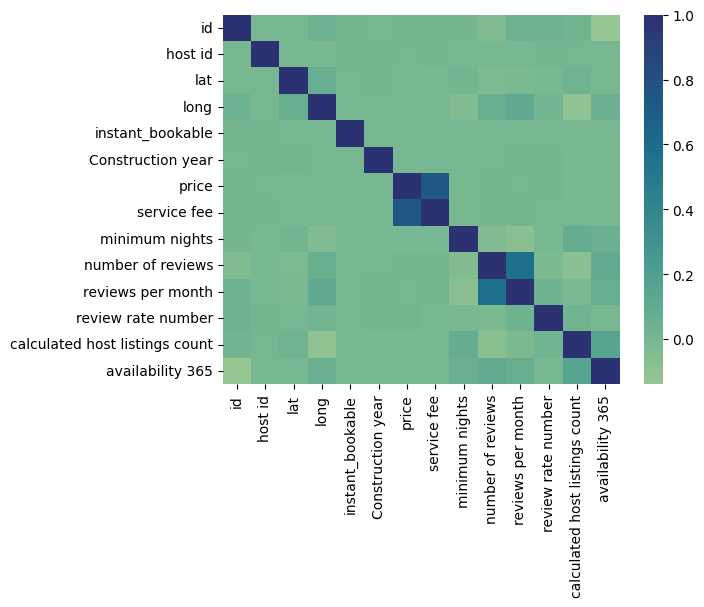

In [36]:
sns.heatmap(df1.select_dtypes(include=np.number).corr(),center=0.4,cmap='crest')

# Dealing with outliers

In [93]:
for i in d1:
  q1=df1[i].quantile(0.25)
  q3=df1[i].quantile(0.75)
  iqr=q3-q1
  outlier_l=q1-1.5*iqr
  outlier_u=q3+1.5*iqr
  outliers=df1[((df1[i]<outlier_l)|(df1[i]> outlier_u))]

  print(outliers[i])

Series([], Name: id, dtype: int64)
Series([], Name: host id, dtype: int64)
11444    40.87157
15186    40.57941
28038    40.57962
30971    40.57942
32831    40.57941
33759    40.57951
44057    40.87160
52601    40.87166
54685    40.57955
57693    40.87160
59455    40.87152
61393    40.57955
61945    40.87157
62864    40.57951
64001    40.57946
69165    40.87160
73929    40.57942
85008    40.57941
93904    40.57942
95764    40.57941
96692    40.57951
Name: lat, dtype: float64
200      -73.87856
202      -73.87854
651      -73.88066
1042     -73.87883
1065     -73.87873
            ...   
99332    -73.87762
100027   -73.88049
100504   -73.87737
101411   -73.88019
102040   -73.87938
Name: long, Length: 390, dtype: float64
Series([], Name: instant_bookable, dtype: float64)
Series([], Name: Construction year, dtype: float64)
Series([], Name: minimum nights, dtype: float64)
Series([], Name: number of reviews, dtype: float64)
Series([], Name: reviews per month, dtype: float64)
Series([], Name:

latitude has 144 0utliers
longitude has 1893 outliers
number of reviews has 1385 outliers
reviews per month has 4861 outliers
calculated host listing counts has 18021 outliers

In [94]:
dg=pd.DataFrame()

for i in d1:
  q1=df1[i].quantile(0.25)
  q3=df1[i].quantile(0.75)
  iqr=q3-q1
  outlier_l=q1-1.5*iqr
  outlier_u=q3+1.5*iqr
  outliers=df1[((df1[i]<outlier_l)|(df1[i]> outlier_u))]
  print(outliers[i])


  if not outliers.empty:
    df1.loc[outliers.index,i]=df1[i].mean()
dg=df1.copy()
print(dg)






Series([], Name: id, dtype: int64)
Series([], Name: host id, dtype: int64)
11444    40.87157
15186    40.57941
28038    40.57962
30971    40.57942
32831    40.57941
33759    40.57951
44057    40.87160
52601    40.87166
54685    40.57955
57693    40.87160
59455    40.87152
61393    40.57955
61945    40.87157
62864    40.57951
64001    40.57946
69165    40.87160
73929    40.57942
85008    40.57941
93904    40.57942
95764    40.57941
96692    40.57951
Name: lat, dtype: float64
200      -73.87856
202      -73.87854
651      -73.88066
1042     -73.87883
1065     -73.87873
            ...   
99332    -73.87762
100027   -73.88049
100504   -73.87737
101411   -73.88019
102040   -73.87938
Name: long, Length: 390, dtype: float64
Series([], Name: instant_bookable, dtype: float64)
Series([], Name: Construction year, dtype: float64)
Series([], Name: minimum nights, dtype: float64)
Series([], Name: number of reviews, dtype: float64)
Series([], Name: reviews per month, dtype: float64)
Series([], Name:

In [39]:
print(dg)

              id                                              NAME  \
0        1001254                Clean & quiet apt home by the park   
1        1002102                             Skylit Midtown Castle   
2        1002403               THE VILLAGE OF HARLEM....NEW YORK !   
3        1002755                               Home away from home   
4        1003689  Entire Apt: Spacious Studio/Loft by central park   
...          ...                                               ...   
102053  57365208               Cozy bright room near Prospect Park   
102054  57365760         Private Bedroom with Amazing Rooftop View   
102055  57366313     Pretty Brooklyn One-Bedroom for 2 to 4 people   
102056  57366865        Room & private bathroom in historic Harlem   
102057  57367417                                   Rosalee Stewart   

            host id host_identity_verified host name neighbourhood group  \
0       80014485718            unconfirmed  Madaline            Brooklyn   
1      

# Boxplot to display distribution of data

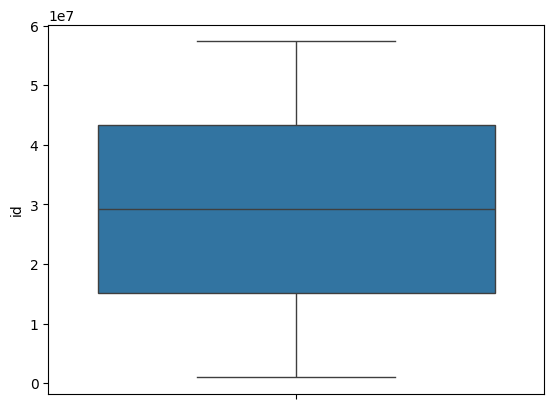

id


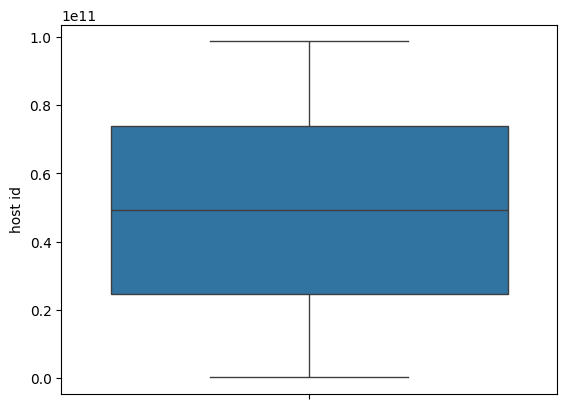

host id


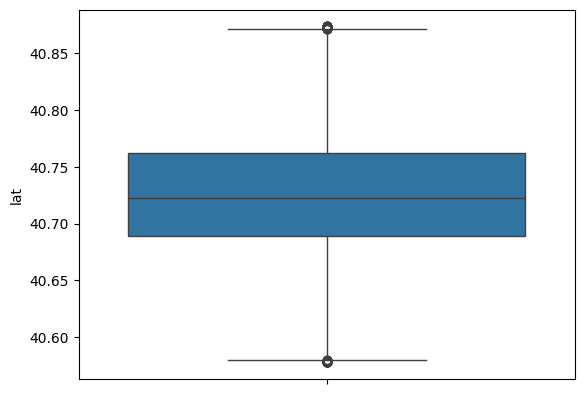

lat


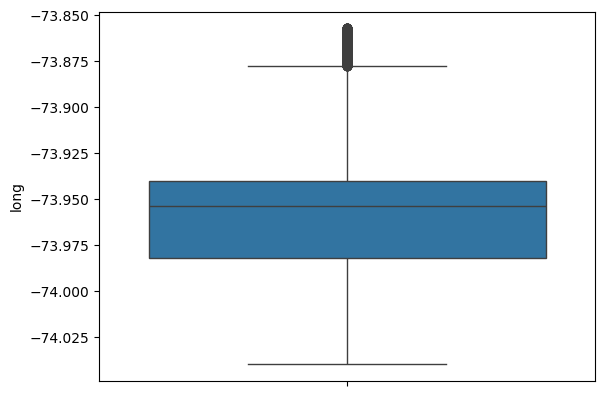

long


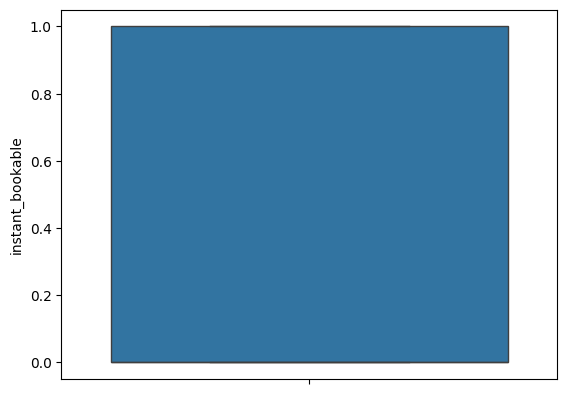

instant_bookable


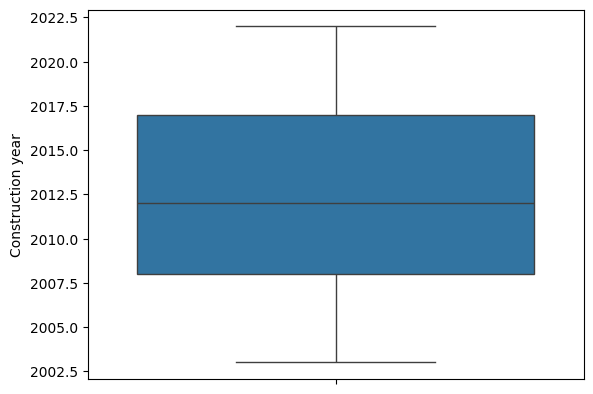

Construction year


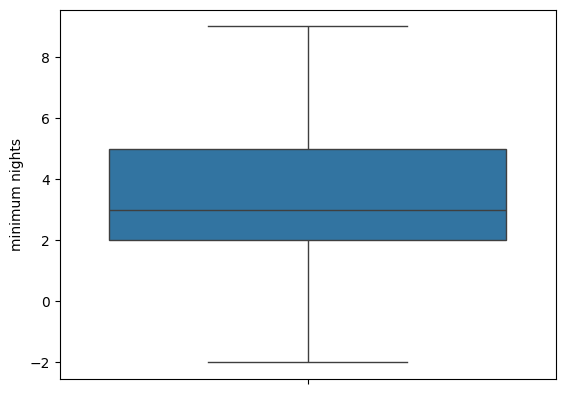

minimum nights


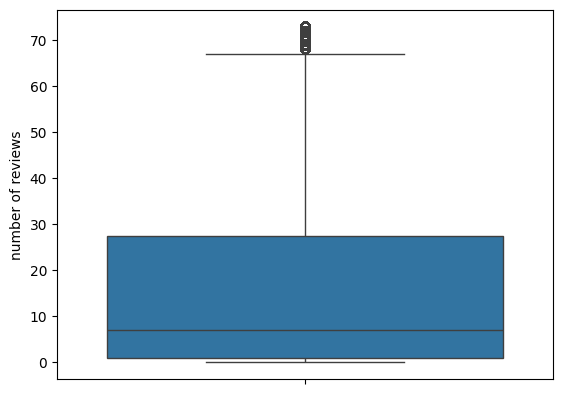

number of reviews


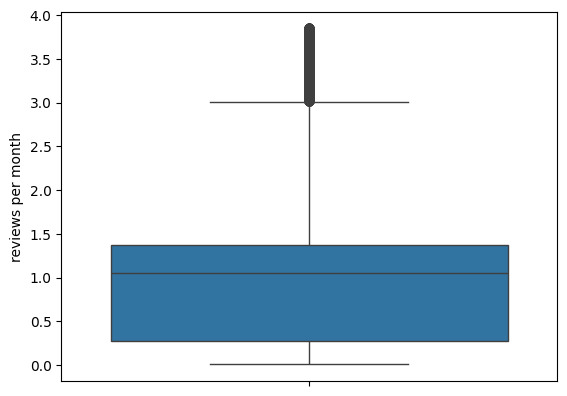

reviews per month


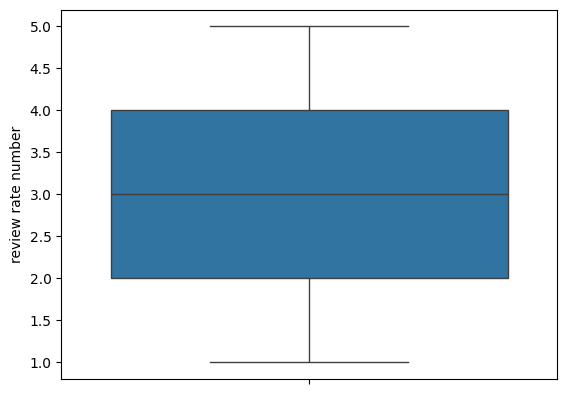

review rate number


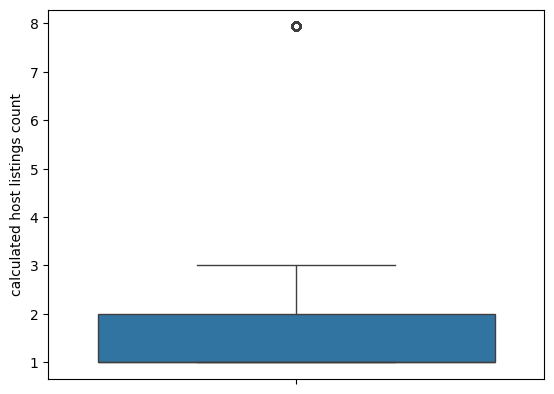

calculated host listings count


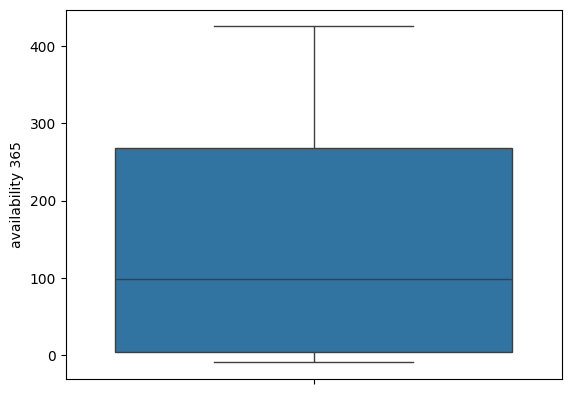

availability 365


In [40]:
for i in d1:
  sns.boxplot(dg[i])
  plt.show()
  print(i)

In [41]:
dg.isna().sum()

id                                0
NAME                              0
host id                           0
host_identity_verified            0
host name                         0
neighbourhood group               0
neighbourhood                     0
lat                               0
long                              0
country                           0
country code                      0
instant_bookable                  0
cancellation_policy               0
room type                         0
Construction year                 0
price                             0
service fee                       0
minimum nights                    0
number of reviews                 0
last review                       0
reviews per month                 0
review rate number                0
calculated host listings count    0
availability 365                  0
house_rules                       0
license                           0
dtype: int64

Checking distribution of data for price and service fee to know the usual $ that is charged

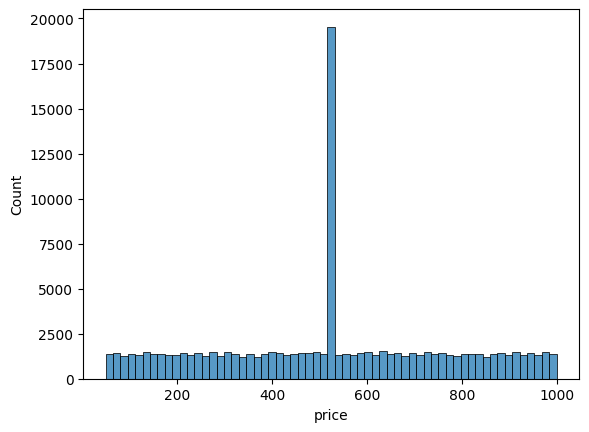

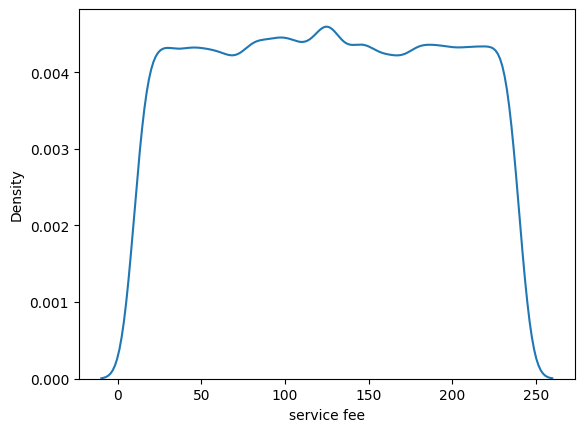

In [42]:
sns.histplot(dg['price'])
plt.show()

plt.show()
sns.kdeplot(dg['service fee'])
plt.show()

sns.set(font_scale=2)

Checking relation of service fees and contruction years alongwith price vs construction year

although service distribution is uniform , the probability distribution of price is highest between 400 and 600 so this might be most general price range of airbnb in US

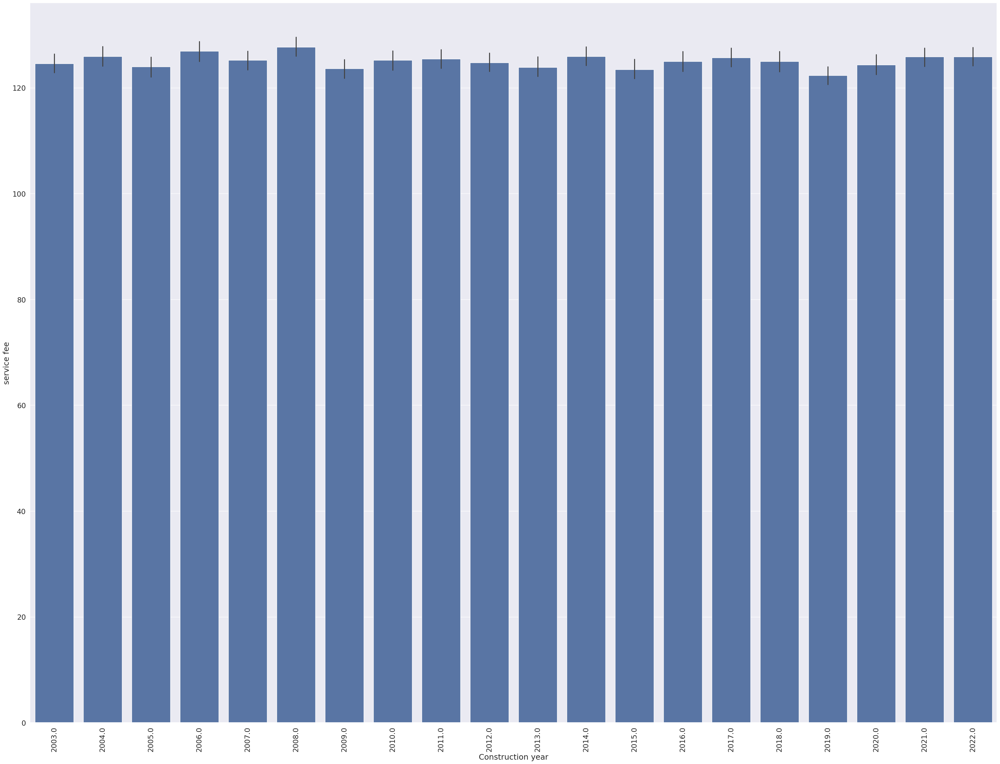

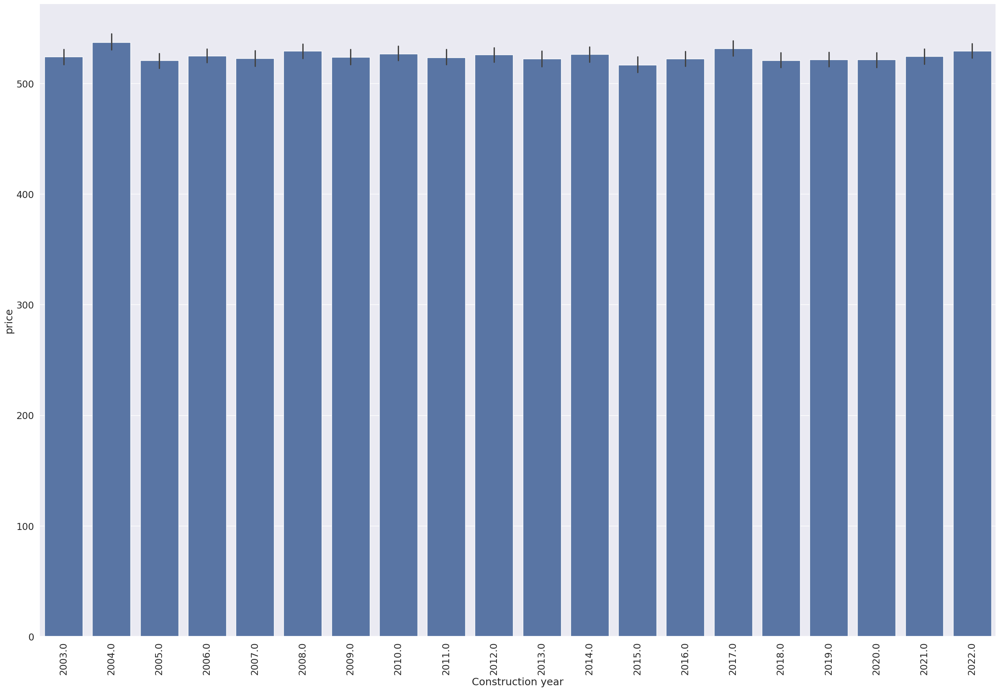

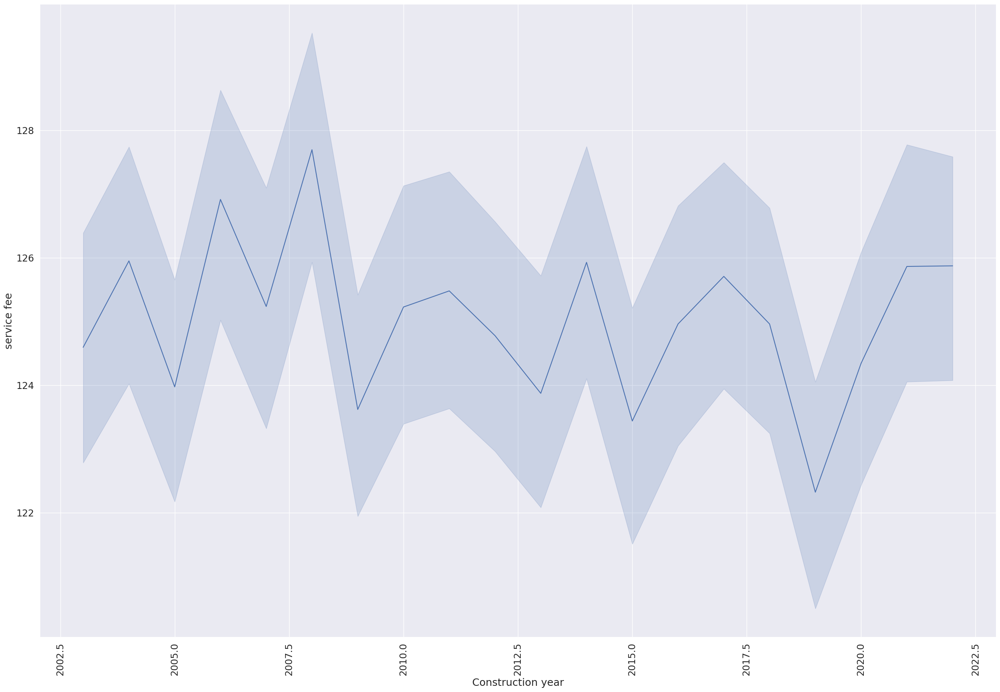

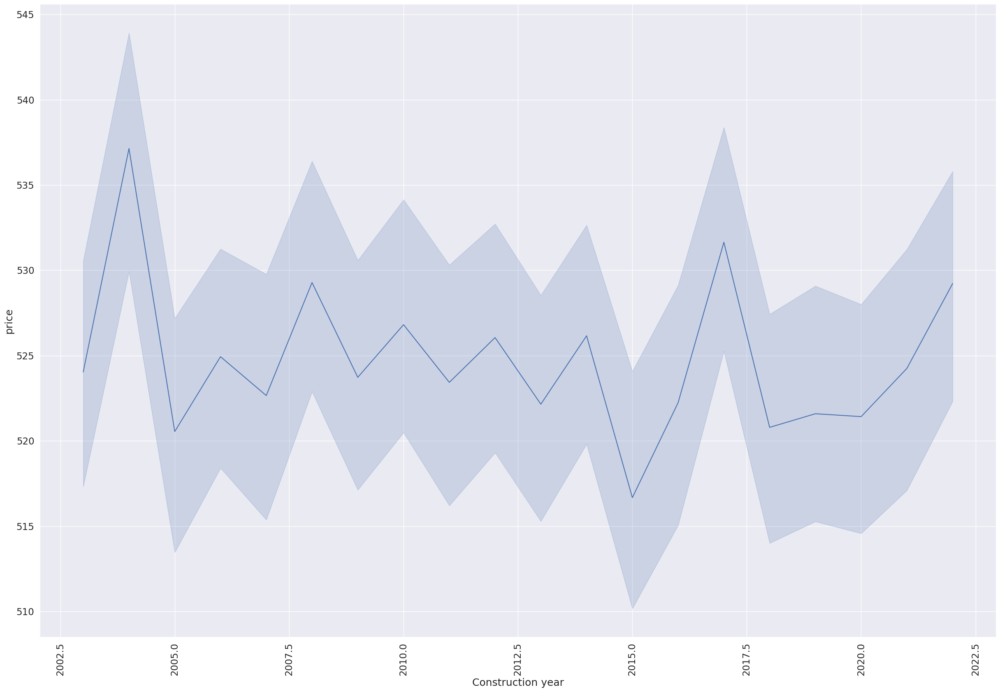

In [71]:
sns.barplot(dg,y=dg['service fee'],x=dg['Construction year'])
sns.set(font_scale=1.5)
sns.set(rc={'figure.figsize':(30,20)})

plt.xticks(rotation=90)
sns.set(font_scale=1.5)
plt.show()
sns.barplot(dg,y=dg['price'],x=dg['Construction year'])
plt.xticks(rotation=90)
sns.set(font_scale=1.5)
plt.show()
sns.lineplot(dg,y=dg['service fee'],x=dg['Construction year'])
plt.xticks(rotation=90)
sns.set(font_scale=1.5)
plt.show()
sns.lineplot(dg,y=dg['price'],x=dg['Construction year'])
plt.xticks(rotation=90)
sns.set(font_scale=1.5)
plt.show()

(array([    0., 20000., 40000., 60000., 80000.]),
 [Text(1, 0.0, '0'),
  Text(1, 20000.0, '20000'),
  Text(1, 40000.0, '40000'),
  Text(1, 60000.0, '60000'),
  Text(1, 80000.0, '80000')])

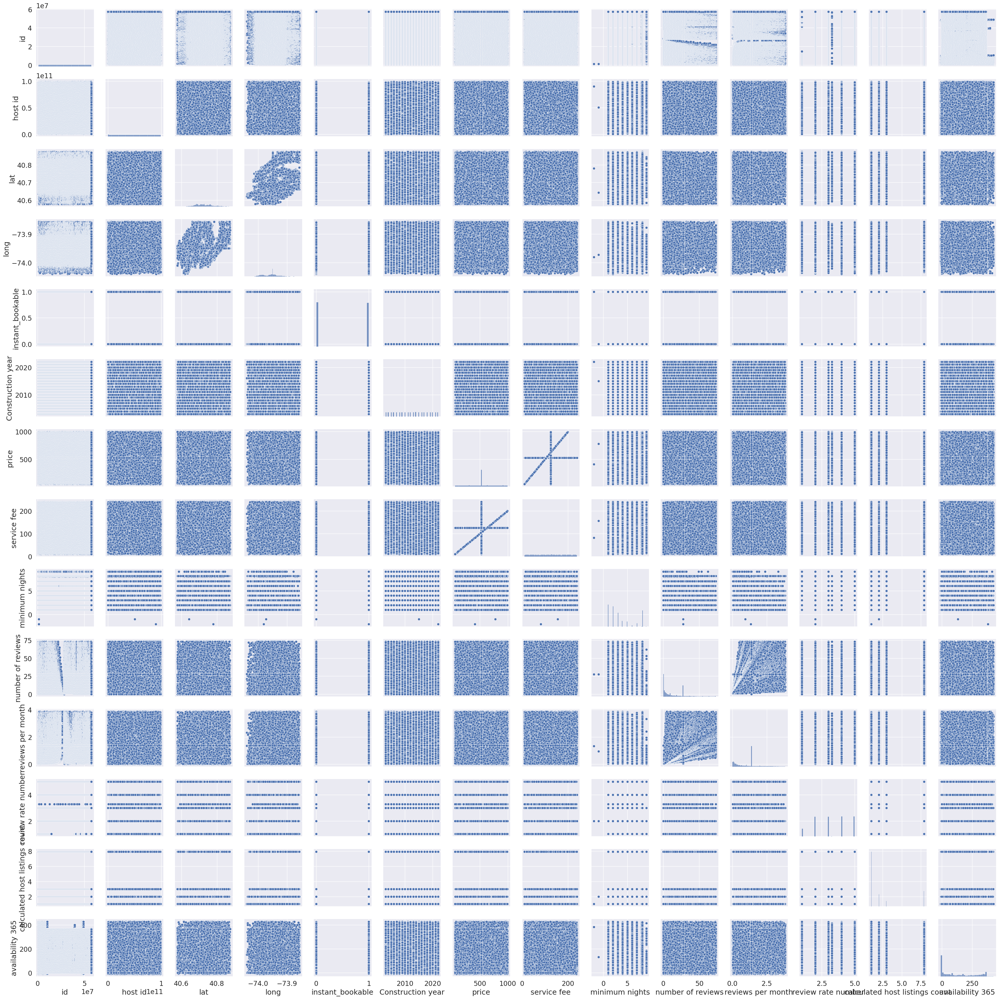

In [44]:
sns.pairplot(dg)
plt.xticks(rotation=90)
plt.yticks(rotation=90)

from all the plots and heatmap and correlation we can infer that there are linear relationships between (price and service fee),(reviews per month and number of reviews) and(latitude and longitude)

In [45]:
print(d1,d2)

Index(['id', 'host id', 'lat', 'long', 'instant_bookable', 'Construction year',
       'minimum nights', 'number of reviews', 'reviews per month',
       'review rate number', 'calculated host listings count',
       'availability 365'],
      dtype='object') Index(['NAME', 'host_identity_verified', 'host name', 'neighbourhood group',
       'neighbourhood', 'country', 'country code', 'cancellation_policy',
       'room type', 'price', 'service fee', 'last review', 'house_rules',
       'license'],
      dtype='object')


# Dataset is cleaned now so I will export my excel file

In [46]:
dg.to_excel('cleaned_airbnb_data2.xlsx')

In [47]:
dg.describe()

,id,host id,lat,long,instant_bookable,Construction year,price,service fee,minimum nights,number of reviews,reviews per month,review rate number,calculated host listings count,availability 365
count,1.020580e+05,1.020580e+05,102058.000000,102058.000000,102058.000000,102058.000000,102058.000000,102058.000000,102058.000000,102058.000000,102058.000000,102058.000000,102058.000000,102058.000000
mean,2.918438e+07,4.926738e+10,40.727607,-73.956091,0.497433,2012.491260,524.741260,125.039216,3.617426,14.793037,1.091034,3.278734,2.493881,141.009737
std,1.627173e+07,2.853742e+10,0.053741,0.030968,0.499996,5.760204,248.069632,66.237136,2.612405,16.965045,0.898472,1.283079,2.581179,134.677517
min,1.001254e+06,1.236005e+08,40.577700,-74.039690,0.000000,2003.000000,50.000000,10.000000,-2.000000,0.000000,0.010000,1.000000,1.000000,-10.000000
25%,1.509286e+07,2.459924e+10,40.689000,-73.981760,0.000000,2008.000000,341.000000,68.000000,2.000000,1.000000,0.280000,2.000000,1.000000,3.000000
50%,2.918438e+07,4.912865e+10,40.722680,-73.953860,0.000000,2012.000000,524.702448,125.000000,3.000000,7.000000,1.050000,3.000000,1.000000,98.000000
75%,4.327590e+07,7.400619e+10,40.762070,-73.939973,1.000000,2017.000000,709.000000,182.000000,5.000000,27.517887,1.375193,4.000000,2.000000,268.000000
max,5.736742e+07,9.876313e+10,40.873720,-73.857040,1.000000,2022.000000,999.000000,240.000000,9.000000,73.000000,3.850000,5.000000,7.936936,426.000000


# Analyzing  and plotting dataset on basis of neighbourhood to see if neighbourhood affects the parameters like price ,service fees with regards to their aggregate functions to check relationships among them

In [48]:
daa=dg.groupby(['neighbourhood group'])['price'].sum()
for i,j in daa.items():
  print(i)
  print(j)


Bronx
1431066.8283579438
Brooklyn
21872418.4928892
Manhattan
22829892.89954884
Queens
6916626.2942486
Staten Island
504038.9867257161


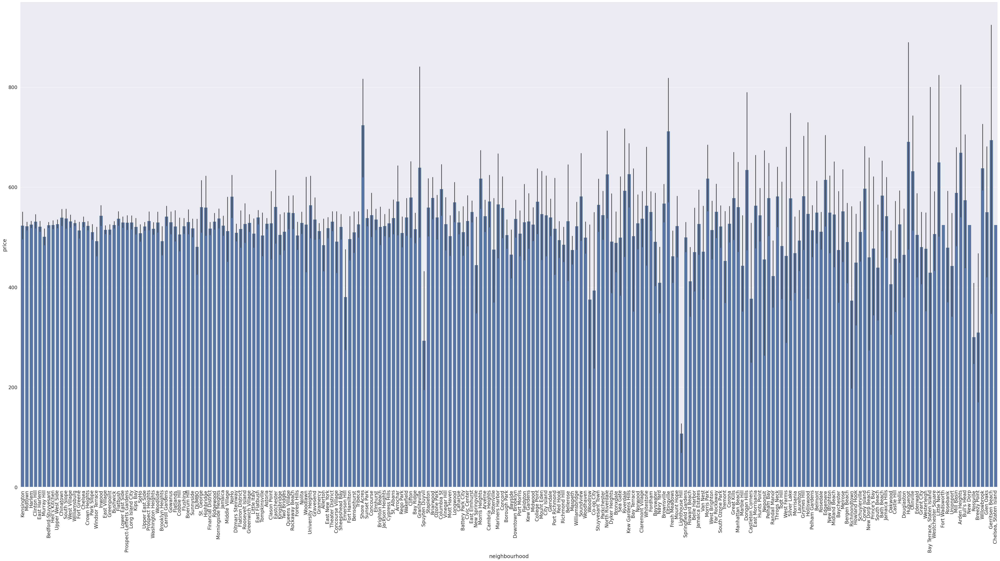

In [73]:
sns.barplot(x=dg['neighbourhood'],y=dg['price'])
plt.xticks(rotation=90)
sns.set(rc={'figure.figsize':(100,30)})
sns.set(font_scale=1.2)
plt.show()


In [50]:
dab=dg.groupby(['neighbourhood group'])['price'].mean()
for i,j in dab.items():
  print(i)
  print(j)
dac=dg.groupby(['neighbourhood group'])['service fee'].mean()
for i,j in dac.items():
  print(i)
  print(j)


Bronx
531.2052072598158
Brooklyn
525.387775765396
Manhattan
523.7775689895803
Queens
524.1059554632568
Staten Island
531.1264349059179
Bronx
125.44883501949553
Brooklyn
125.23689503021576
Manhattan
124.52508749252388
Queens
126.04902192402609
Staten Island
124.7756383258804


# plotting my grouped data

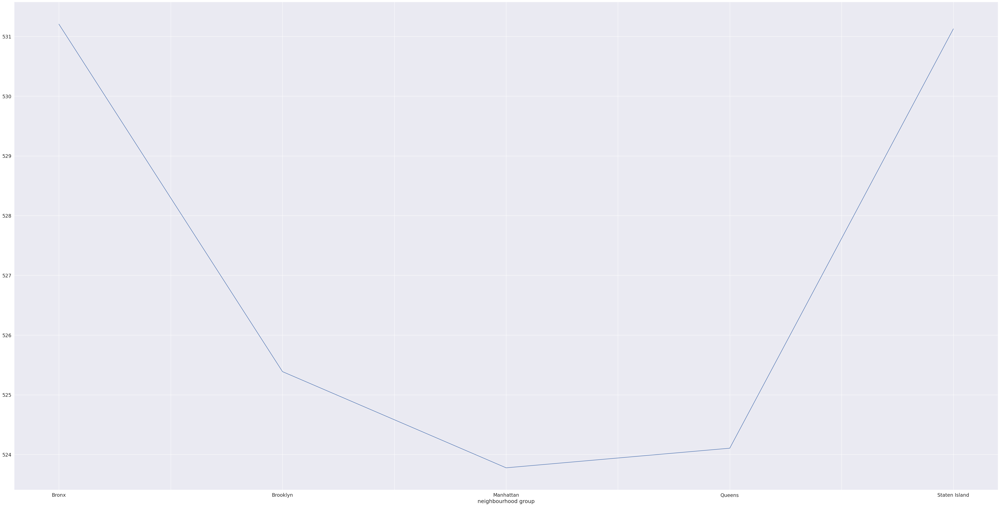

In [51]:
dab.plot()
sns.set(rc={'figure.figsize':(60,30)})
sns.set(font_scale=5)

displaying mean price across different neigbourhoods


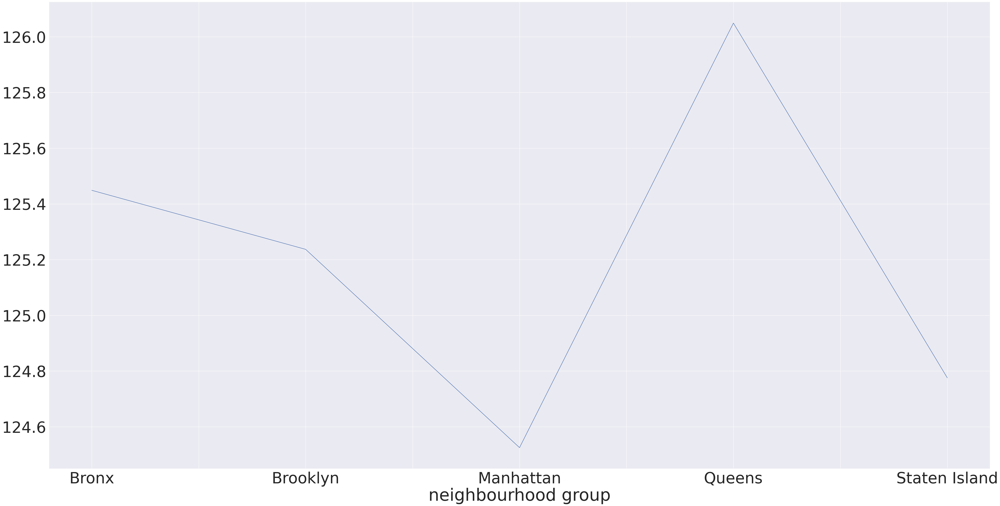

In [52]:
dac.plot()
sns.set(rc={'figure.figsize':(60,30)})
sns.set(font_scale=5)

displaying mean service fee across different neigbourhoods


# Percentages of service fees with respect of prices of residences regionwise and keeping aggregate functions in consideration

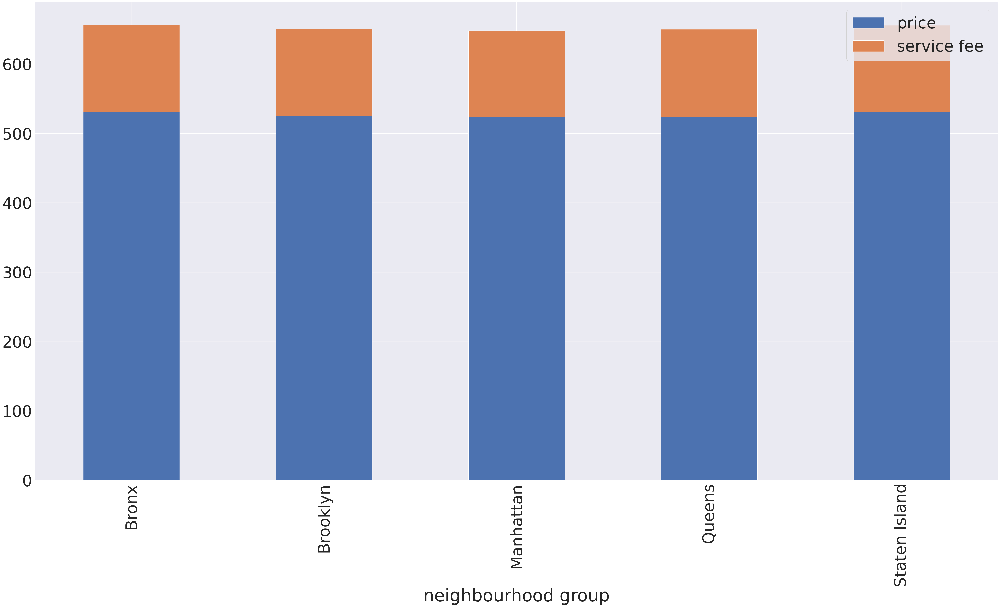

In [53]:
dad = dg.groupby(['neighbourhood group'])[['price','service fee']].mean()
dad.plot(kind='bar',stacked=True)
sns.set(rc={'figure.figsize':(60,30)})
sns.set(font_scale=1)

In [54]:
dada=dg.groupby(['neighbourhood group'])['service fee'].apply(lambda x:np.mean((x/dg['price'])*100)).reset_index()
for i,j in dada.items():
  print(i)
  print(j)

neighbourhood group
0            Bronx
1         Brooklyn
2        Manhattan
3           Queens
4    Staten Island
Name: neighbourhood group, dtype: object
service fee
0    23.679835
1    23.858844
2    23.802427
3    24.071522
4    23.546799
Name: service fee, dtype: float64


In [55]:
dada1=dg.groupby(['neighbourhood group'])['service fee'].apply(lambda x:np.max((x/dg['price'])*100)).reset_index()
for i,j in dada1.items():
  print(i)
  print(j)

neighbourhood group
0            Bronx
1         Brooklyn
2        Manhattan
3           Queens
4    Staten Island
Name: neighbourhood group, dtype: object
service fee
0     85.634879
1    138.918804
2    250.053848
3    148.841576
4     45.740210
Name: service fee, dtype: float64


In [56]:
dada7=dg.groupby(['neighbourhood group'])['service fee'].apply(lambda x:np.std((x/dg['price'])*100)).reset_index()
for i,j in dada7.items():
  print(i)
  print(j)

neighbourhood group
0            Bronx
1         Brooklyn
2        Manhattan
3           Queens
4    Staten Island
Name: neighbourhood group, dtype: object
service fee
0    8.296520
1    8.481370
2    8.583147
3    8.706736
4    8.048905
Name: service fee, dtype: float64


In [57]:
dada72=dg.groupby(['neighbourhood group'])['service fee'].apply(lambda x:np.min((x/dg['price'])*100)).reset_index()
for i,j in dada72.items():
  print(i)
  print(j)

neighbourhood group
0            Bronx
1         Brooklyn
2        Manhattan
3           Queens
4    Staten Island
Name: neighbourhood group, dtype: object
service fee
0     3.239932
1     2.287010
2     1.905842
3     6.479863
4    16.771410
Name: service fee, dtype: float64


*checking distribution of percentages*

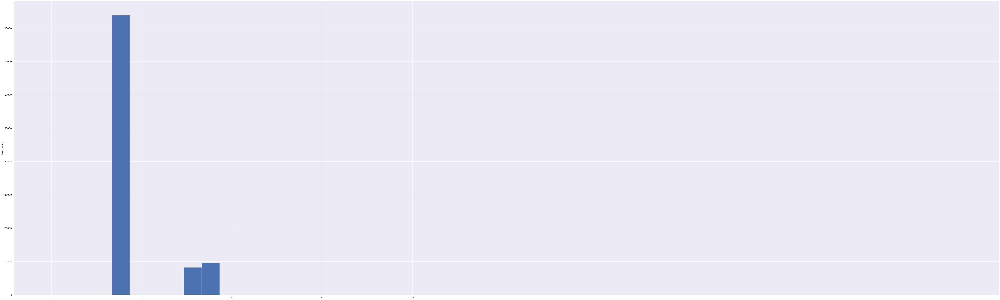

In [85]:
((dg['service fee']/dg['price'])*100).plot(kind='hist',bins=50)
plt.xticks(np.linspace(0,100,5))
plt.show()

from this graph and previous groupby function we can infer that service fee charged in all of us usually ranges from 16-32 with few places having exceptions

In [59]:
dg['host name'].value_counts()

host name
Michael             1284
David                761
John                 577
Alex                 543
Sonder (NYC)         516
                    ... 
Janio                  1
W. Jesse               1
Lisa And Jessica       1
Toli                   1
Laksen & Nikki         1
Name: count, Length: 13189, dtype: int64

In [60]:
dg['NAME'].value_counts()

NAME
Home away from home                                    303
Water View King Bed Hotel Room                          30
Hillside Hotel                                          30
Brooklyn Apartment                                      27
New york Multi-unit building                            27
                                                      ... 
Modern & trendy serenityâ€”great High Line location      1
Quiet, light-filled, Soho apartment                      1
Sunny and cozy room 10 minutes from Times Sq.61F3        1
1 bedroom apartment across the Central Park              1
Parisian Style Apartment in Heart of Brooklyn            1
Name: count, Length: 61280, dtype: int64

# Checking effect cancellation policy on review rate number and reviews per month

In [61]:
dg['room type'].value_counts()

room type
Entire home/apt    53429
Private room       46306
Shared room         2208
Hotel room           115
Name: count, dtype: int64

In [62]:
dg['cancellation_policy'].value_counts()

cancellation_policy
moderate    34238
strict      33929
flexible    33891
Name: count, dtype: int64

In [63]:
dg['review rate number'].value_counts(

)

review rate number
5.000000    23251
4.000000    23200
3.000000    23130
2.000000    22972
1.000000     9186
3.279106      319
Name: count, dtype: int64

review rate number
cancellation_policy
flexible    3.279859
moderate    3.279169
strict      3.277171
Name: review rate number, dtype: float64
reviews per month
cancellation_policy
flexible    1.091225
moderate    1.093565
strict      1.088290
Name: reviews per month, dtype: float64


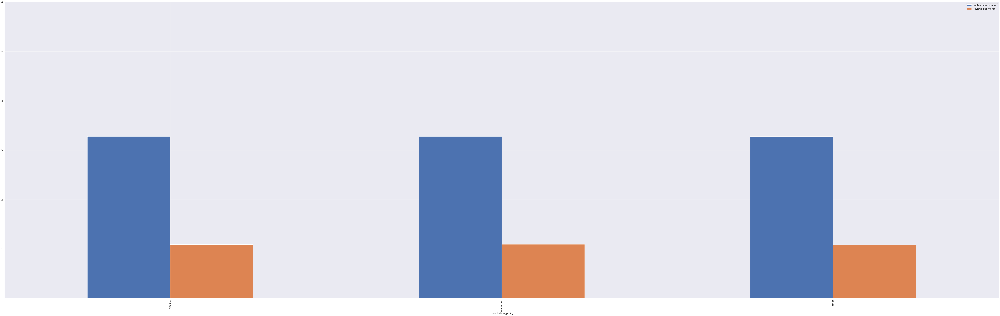

In [84]:
daba=dg.groupby(['cancellation_policy'])[['review rate number','reviews per month']].mean()
for i,j in daba.items():
  print(i)
  print(j)
daba.plot(kind='bar')
plt.yticks(np.linspace(1,6,6))
plt.rcParams['font.size'] = 5

# Checking effect room type on review rate number and reviews per month

review rate number
room type
Entire home/apt    3.274799
Hotel room         3.539130
Private room       3.281364
Shared room        3.305233
Name: review rate number, dtype: float64
reviews per month
room type
Entire home/apt    1.084666
Hotel room         0.888771
Private room       1.096177
Shared room        1.147825
Name: reviews per month, dtype: float64


([<matplotlib.axis.YTick at 0x7cbc06d14430>,
 [Text(0, 1.0, '1'),
  Text(0, 2.0, '2'),
  Text(0, 3.0, '3'),
  Text(0, 4.0, '4'),
  Text(0, 5.0, '5'),
  Text(0, 6.0, '6')])

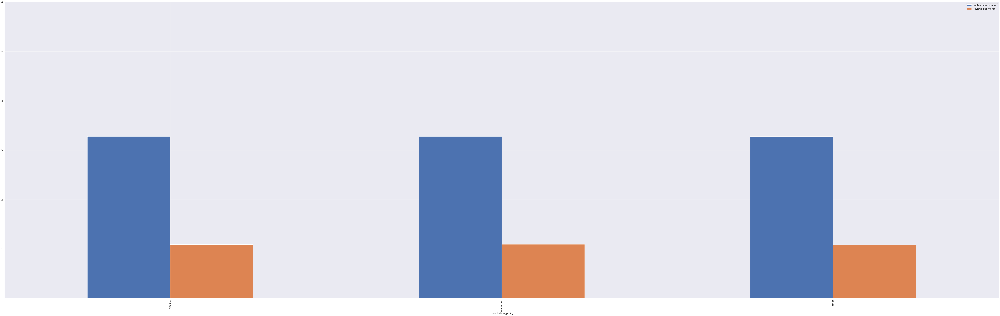

In [83]:
daba1=dg.groupby(['room type'])[['review rate number','reviews per month']].mean()
for i,j in daba1.items():
  print(i)
  print(j)
daba.plot(kind='bar')
plt.rcParams['font.size'] = 5
plt.yticks(np.linspace(1,6,6))


# Checking distribution of host id and id on basis of neighbourhoods

host id
neighbourhood group
Bronx             2694
Brooklyn         41631
Manhattan        43587
Queens           13197
Staten Island      949
Name: host id, dtype: int64
id
neighbourhood group
Bronx             2694
Brooklyn         41631
Manhattan        43587
Queens           13197
Staten Island      949
Name: id, dtype: int64


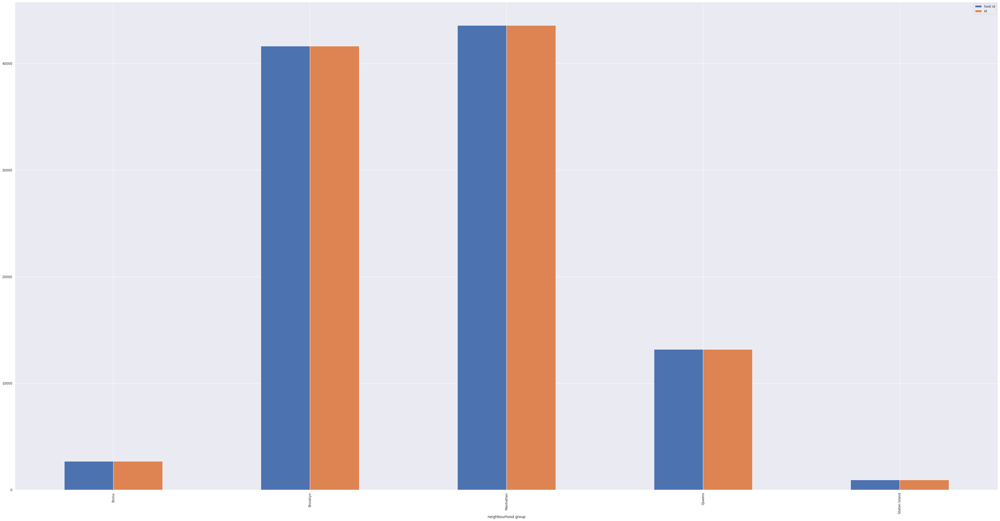

In [66]:
dadaw=dg.groupby(['neighbourhood group'])[[('host id'),('id')]].count()
dadaw.plot(kind='bar')
sns.set(rc={'figure.figsize':(60,30)})
sns.set(font_scale=2)
for i,j in dadaw.items():
  print(i)
  print(j)

it is clear that majority of hosts renting out their property on airbnb reside in brooklyn and manhattan

In [67]:
dadaw2=dg.groupby(['NAME'])[('host name')].value_counts().sort_values(ascending=True)

for i,j in dadaw2.items():
  print(i)
  print(j)

Streaming output truncated to the last 5000 lines.
('Cozy studio in Chelsea', 'Majeed')
4
('Cozy studio in Chelsea for one or two travellers', 'Harry')
4
('Ready!', 'Martha')
4
('Private Bedroom & bath - Huge Apt in Williamsburg', 'Idit')
4
('Private room in stylish uptown apartment', 'Kareem')
4
('Cozy studio in Park Slope', 'Fourth')
4
('Private room in super location in lower Manhattan', 'Maria')
4
('PRIVATE ROOM - BEST PRICE', 'Diana')
4
('PRIVATE ROOM - Sunny and Spacious - Brooklyn Loft', 'Aurelien')
4
('PRIVATE ROOM CLOSE TO THE CITY AND JFK  AIRPORT.', 'Maria')
4
('Private room in the heart of East village', 'Chris')
4
('Elegant Entire apartment prospect lefferts garden', 'Cg')
4
('Cozy studio in historic Clinton Hill near trains', 'Ashley')
4
('Private room in shared apartment for 1', 'Ian')
4
('Bedroom + Private Bath Near Central Park & Subways', 'Nicolle')
4
('Cozy studio in Brooklyn', 'Lei')
4
('Bright large Williamsburg 1 bed apartment', 'Paul')
4
('1 BR Suite in Midtown M

In [86]:
dg['NAME'] = dg['NAME'].astype(str)
dadaw245 = dg.groupby(['NAME'])['NAME'].value_counts().sort_values(ascending=True)
for i in dadaw245.items():
  print(i)


Streaming output truncated to the last 5000 lines.
('Queen sized bedroom with skyline view - Greenpoint', 3)
('Studio in our home Jamaica, Queens 17Min JFK', 3)
('Cool studio in midtown Manhattan', 3)
('Cool town house', 3)
('yahmanscrashpads', 3)
('Quiet sanctuary in the heart of the UES', 3)
('Cool, clean and confortable 1 bedroom in Bushwick', 3)
('Large 2 Story 2 Bedroom Corner Unit On Top Floor', 3)
('Kikiâ€™s Place!', 3)
('@Ferry,Large Private Rm,Renovated/Stylish,Views...', 3)
('Quiet room with loft bed', 3)
('12min to NY & 10minLGA/30minJFK, Fit Mem for 1mth+', 3)
('Studio in Vibrant Lower East Side', 3)
('Cosy Midtown Studio', 3)
("@BrooklynWhisky's: Birdsnest-Guest Room", 3)
('127 St & Convent Av NYC ABCD RM 3', 3)
('Cozy Brooklyn Heights Apartment!', 3)
('Kitschy Corner Bedroom on a Friendly Astoria Block', 3)
('Cozy Brooklyn Apt (Near JFK/Manhattan/Times Sqr)', 3)
('Cosy one-bedroom nest in the heart of Williamsburg', 3)
('Queens, Astoria - Apartment & Room with NYC view.',

In [87]:
dg['host name'] = dg['host name'].astype(str)

dadaw132=dg.groupby(['host name'])[('host name')].value_counts().sort_values(ascending=True)

for i in dadaw132.items():
  print(i)


Streaming output truncated to the last 5000 lines.
('Reynaldo', 3)
('Ð\x90Ð»ÐµÐºÑ\x81ÐµÐ¹', 3)
('Jordania', 3)
('Jordi', 3)
('Jordy', 3)
('Jordyn', 3)
('Ð¢est', 3)
('Joris', 3)
('Abdul Fattah', 3)
('Rez', 3)
('Reza', 3)
('Zyanya', 3)
('Yenpo', 3)
('Rei', 3)
('Jiyoung', 3)
('Aleisha', 3)
('Alegria', 3)
('Ravita', 3)
('Alea', 3)
('Aldus', 3)
('Yola', 3)
('Cristine', 3)
('Yomi', 3)
('Jenniffer', 3)
('Kells', 3)
('Yonathan', 3)
('Yonaton', 3)
('Yonette', 3)
('Kellan', 3)
('Rodolfo', 3)
('Yongqiu', 3)
('Raymond And Kymme', 3)
('Darris', 3)
('Raynald', 3)
('Jeny', 3)
('Albena', 3)
('Jerald', 3)
('Keiko & Ilya', 3)
('Yosef And Chava', 3)
('Jeremy & Angela', 3)
('Keegan', 3)
('Keah', 3)
('Kenna', 3)
('Jenn And Mike', 3)
('Yizhak', 3)
('Alejo', 3)
('RaphaÃ«lle', 3)
("Jeanne - Aka, 'Rindy'", 3)
('Keziah', 3)
('Keyonna', 3)
('Kevin Unal', 3)
('Jeannine', 3)
('Yety', 3)
('Yi-Chen', 3)
('Ketty', 3)
('Ketia', 3)
('Jefferson', 3)
('Jeffery', 3)
('Alex & Alena', 3)
('Darnell And Allison', 3)
('RojÃ©',

***we are now aware of our service's top users and places that are rented out and thus we can take their reviews and their activities on app into consideration and provide recomendations accordingly***